# Introduction

This notbook will test different RNN models using LSTM layers to predict the future of a double pendulum system. We start off by giving the positions of the 1st and 2nd pendulum with a certain initial condition. We then test that model on different initial conditions without retraining the model, and compare it to the actual solution. We then test how far the model can predict into the future by testing different extrapolation time (offset). We repeat this process for different initial conditions and test the model precision. Lastly we repeat all the steps we have done but train the models only on the second mass coordinate and compare the results to our previous result. First part of the notebook is provided by the PHAS0052 course at University College London

#### Positions
$$x_1 = L_1 \sin \theta_1$$
$$y_1 = -L_1 \cos \theta_1$$
$$x_2 = x_1 + L_2 \sin \theta_2$$
$$y_2 = y_1 - L_2 \cos \theta_2$$

#### Velocities
$$\dot{x}_1 = \dot{\theta_1} L_1 \cos \theta_1$$
$$\dot{y_1} =  \dot{\theta_1} L_1 \sin \theta_1$$
$$\dot{x_2} = \dot{x_1} + \dot{\theta_2} L_2 \cos \theta_2$$
$$\dot{y_2} = \dot{y_1} + \dot{\theta_2} L_2 \sin \theta_2$$


#### Accelerations

$$\ddot{x}_1 = -\dot{\theta_1}^2 L_1 \sin \theta_1 + \ddot{\theta_1} L_1 \cos \theta_1$$
$$\ddot{y_1} =  \dot{\theta_1}^2 L_1 \cos \theta_1 + \ddot{\theta_1} L_1 \sin \theta_1$$
$$\ddot{x_2} = \ddot{x_1} - \dot{\theta_2}^2 L_2 \sin \theta_2 + \ddot{\theta_2} L_2 \cos \theta_2$$
$$\ddot{y_2} = \ddot{y_1} + \dot{\theta_2}^2 L_2 \cos \theta_2 + \ddot{\theta_2} L_2 \sin \theta_2$$

#### Energies
Let $v_1^2 = \dot{x_1}^2 +\dot{y_1}^2$ and $v_2^2 = \dot{x_2}^2 +\dot{y_2}^2$ then the kinetic energies $T_1$ and $T_2$ are
$$ T_1 = \frac{1}{2}m_1 v_1^2 = \frac{1}{2}m_1 L_1^2 \dot{\theta_1}^2 $$
$$ T_2 = \frac{1}{2}m_2 v_2^2 = \frac{1}{2}m_2 \left( L_1^2 \dot{\theta_1}^2 + L_2^2 \dot{\theta_2}^2 + 2L_1 L_2 \cos(\theta_1-\theta_2) \dot{\theta_1} \dot{\theta_2} \right) $$

The potential enrgies are
$$V_1 = m_1 g y_1 = - m_1 g L_1 \cos \theta_1$$
$$V_2 = m_2 g y_2 = -m_2 g ( L_1 \cos \theta_1 + L_2 \cos \theta_2)$$

#### Langrangian
Now we form the Lagrangian $L=T-V=T_1+T_2 -V_1 -V_2$ and use the Euler-Lagrange equations:
$$\frac{\partial L}{\partial \theta_1} = \frac{d}{dt}\frac{\partial L}{\partial \dot{\theta_1}}$$
$$\frac{\partial L}{\partial \theta_2} = \frac{d}{dt}\frac{\partial L}{\partial \dot{\theta_2}}$$

Applying these gives
$$-(m_1+m_2) g L_1 \sin \theta_1 = (m_1+m_2) L_1^2 \ddot{\theta_1} + m_2 L_1 L_2 \sin(\theta_1-\theta_2) \dot{\theta_2}^2 +  m_2 L_1 L_2 \cos(\theta_1-\theta_2) \ddot{\theta_2} $$
and
$$ -m_2 g L_2 \sin \theta_2 = m_2 L_2 \ddot{\theta_2} + m_2 L_1 L_2 \cos(\theta_1-\theta_2) \ddot{\theta_1} + m_2 L_1 L_2 \sin(\theta_1-\theta_2) \dot{\theta_1}^2 $$ 


#### Equations of motions
$$ \omega_1 = \dot{\theta_1}$$  

$$ \omega_2 = \dot{\theta_2}$$ 
$$ \ddot\theta_1 = \frac{1}{L_1\xi}\left[L_1m_2\cos(\theta_1-\theta_2)\sin(\theta_1-\theta_2)\omega_1^2 + L_2m_2\sin(\theta_1-\theta_2)\omega_2^2 - m_2g\cos(\theta_1-\theta_2)\sin(\theta_2) + (m_1+m_2)g\sin(\theta_1) \right] $$
$$ \ddot\theta_2 = \frac{1}{L_2\xi}\left[L_2m_2\cos(\theta_1-\theta_2)\sin(\theta_1-\theta_2)\omega_2^2 + L_1(m_1+m_2)\sin(\theta_1-\theta_2)\omega_1^2+(m_1+m_2)g\sin(\theta_1)\cos(\theta_1-\theta_2) - (m_1+m_2)g\sin(\theta_2) \right] $$
where 
$$\xi \equiv \cos^2(\theta_1-\theta_2)m_2-m_1-m_2$$


In [1]:
import numpy as np
import matplotlib.pyplot as plt 
from scipy.integrate import solve_ivp
import tensorflow as tf
from tensorflow import keras 

In [2]:
def rhs(t, z, L1, L2, m1, m2, g):
    """
    Returns the right-hand side of the ordinary differential equation describing the double pendulem
    """
    theta1, w1, theta2, w2 = z    #The four components
    cos12 = np.cos(theta1 - theta2)
    sin12 = np.sin(theta1 - theta2)
    sin1 = np.sin(theta1)
    sin2 = np.sin(theta2)
    xi = cos12**2*m2 - m1 - m2
    w1dot = ( L1*m2*cos12*sin12*w1**2 + L2*m2*sin12*w2**2
            - m2*g*cos12*sin2      + (m1 + m2)*g*sin1)/(L1*xi)
    w2dot = -( L2*m2*cos12*sin12*w2**2 + L1*(m1 + m2)*sin12*w1**2
            + (m1 + m2)*g*sin1*cos12  - (m1 + m2)*g*sin2 )/(L2*xi)
    return w1, w1dot, w2, w2dot   #Return the w's and the wdot's


def to_cartesian(theta1, w1, theta2, w2, L1, L2):
    """ Transforms theta and omega to cartesian coordinates
    and velocities x1, y1, x2, y2, vx1, vy1, vx2, vy2
    """
    x1 = L1 * np.sin(theta1)
    y1 = -L1 * np.cos(theta1)
    x2 = x1 + L2 * np.sin(theta2)
    y2 = y1 - L2 * np.cos(theta2)
    vx1 = L1*np.cos(theta1)*w1
    vy1 = L1*np.sin(theta1)*w1
    vx2 = vx1 + L2*np.cos(theta2)*w2
    vy2 = vy1 + L2*np.sin(theta2)*w2
    return x1, y1, x2, y2, vx1, vy1, vx2, vy2
    

In [3]:
# Set up the initial conditions. Here we have lengths and masses
L1, L2 = 1., 1.
m1, m2 = 3., 1.
g = 9.81     # [m/s^2]. Gravitational acceleration

#Starting angles
z0=[np.pi/4,0,np.pi/4,0]
#z0=[0.1,0,0.1,0]

#Time ranges
tmax, dt = 50, 0.1
t = np.arange(0, tmax+dt, dt)

In [5]:
# Solve initial value problem
ret = solve_ivp(rhs, (0,tmax), z0, t_eval=t, args=(L1, L2, m1, m2, g))
z=ret.y
print(np.shape(z))

# Extract result
theta1, w1, theta2, w2 = z[0], z[1], z[2], z[3]
x1, y1, x2, y2, vx1, vy1, vx2, vy2 = to_cartesian(theta1, w1, theta2, w2, L1, L2)

(4, 501)


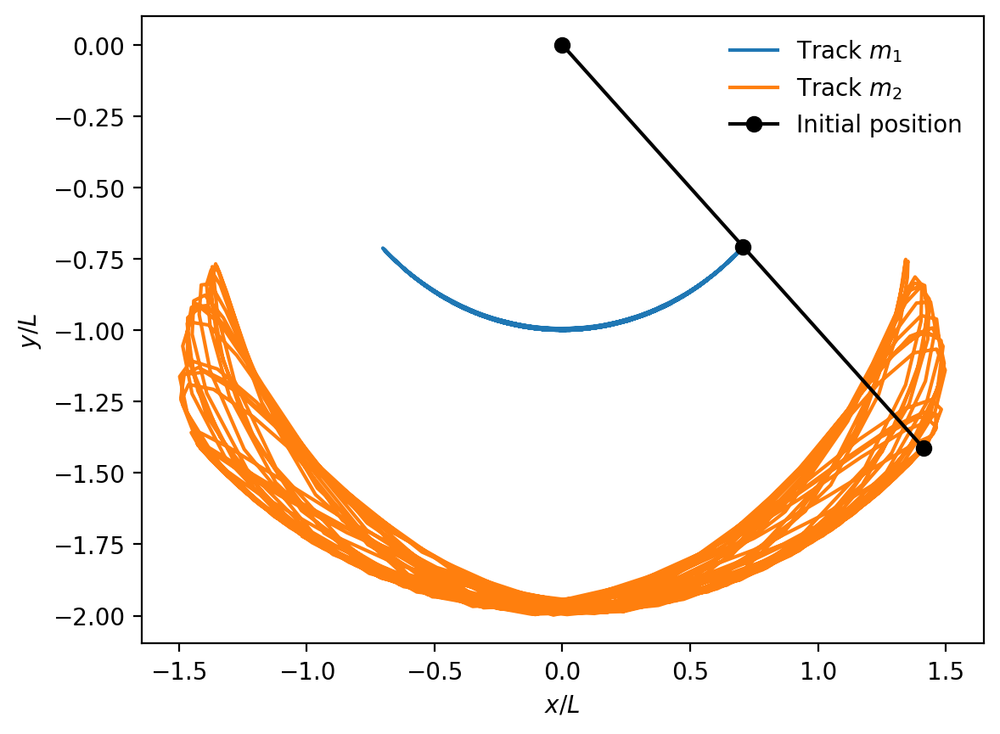

In [6]:
fig,ax=plt.subplots()
ax.plot(x1, y1, label=r"Track $m_1$")
ax.plot(x2, y2, label=r"Track $m_2$")
ax.plot([0, x1[0], x2[0]], [0, y1[0], y2[0]], "-o", label="Initial position", c='k')
plt.ylabel(r"$y/L$")
plt.xlabel(r"$x/L$")
ax.legend()

# TASK 1
Training initial model using a LSTM RNN to determine the future at 20 timestamps after the initial position. Initial position is set to $z_0=[\pi/4,0,\pi/4,0]$. 

In [7]:
# Timesteps ahead for our prediction
window = 20 
offset = 20
# Initialising two lists (X and Y) to store target positions (Y) and input sequences (X)
Input, Label = [], []

# Looping through positions
for i in range(len(x1) - window- offset):
    # Stack the next positions of both masses to serve as the input sequence
    Input.append(np.vstack((x1[i:i+window], y1[i:i+window], x2[i:i+window], y2[i:i+window])).T)
    # Record the positions of both masses 20 steps ahead from the current timestep to set as the prediction target
    Label.append([x1[i+window+offset], y1[i+window+offset], x2[i+window+offset], y2[i+window+offset]])

Input = np.array(Input)
Label = np.array(Label)

In [7]:
model = keras.models.Sequential()
model.add(keras.layers.LSTM(64,input_shape=(None,4), return_sequences=True))
model.add(keras.layers.LSTM(64, return_sequences=True))
model.add(keras.layers.LSTM(32, return_sequences=True))
model.add(keras.layers.LSTM(32, return_sequences=False))
model.add(keras.layers.Dense(4, activation="linear"))  # Output layer with 4 units
model.compile(loss='mean_squared_error', optimizer='adam')

model.summary()



Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm (LSTM)                 (None, None, 64)          17664     
                                                                 
 lstm_1 (LSTM)               (None, None, 64)          33024     
                                                                 
 lstm_2 (LSTM)               (None, None, 32)          12416     
                                                                 
 lstm_3 (LSTM)               (None, 32)                8320      
                                                                 
 dense (Dense)               (None, 4)                 132       
                                                                 
Total params: 71556 (279.52 KB)
Trainable params: 71556 (279.52 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


Creating Training data set / Test data set / Validation data for training

In [8]:
# Training the model using input sequences to predict future positions, validating on 20% of the data
Input_train = Input[0:399,:,:]
Label_train = Label[0:399,:]
Input_test = Input[400:,:,:]
Label_test = Label[400:,:]
model.fit(Input_train, Label_train, epochs=70, batch_size=10, validation_split=0.2)

Epoch 1/70

32/32 [==============================] - 8s 63ms/step - loss: 0.4448 - val_loss: 0.1796
Epoch 2/70
32/32 [==============================] - 1s 19ms/step - loss: 0.0714 - val_loss: 0.0334
Epoch 3/70
32/32 [==============================] - 1s 19ms/step - loss: 0.0232 - val_loss: 0.0173
Epoch 4/70
32/32 [==============================] - 1s 20ms/step - loss: 0.0146 - val_loss: 0.0124
Epoch 5/70
32/32 [==============================] - 1s 19ms/step - loss: 0.0137 - val_loss: 0.0129
Epoch 6/70
32/32 [==============================] - 1s 20ms/step - loss: 0.0140 - val_loss: 0.0127
Epoch 7/70
32/32 [==============================] - 1s 23ms/step - loss: 0.0170 - val_loss: 0.0125
Epoch 8/70
32/32 [==============================] - 1s 20ms/step - loss: 0.0128 - val_loss: 0.0124
Epoch 9/70
32/32 [==============================] - 1s 21ms/step - loss: 0.0126 - val_loss: 0.0118
Epoch 10/70
32/32 [==============================] - 1s 21ms/step - loss: 0.0123 - val_loss: 0.0106
Epoch 11

Testing the model on different initial conditions

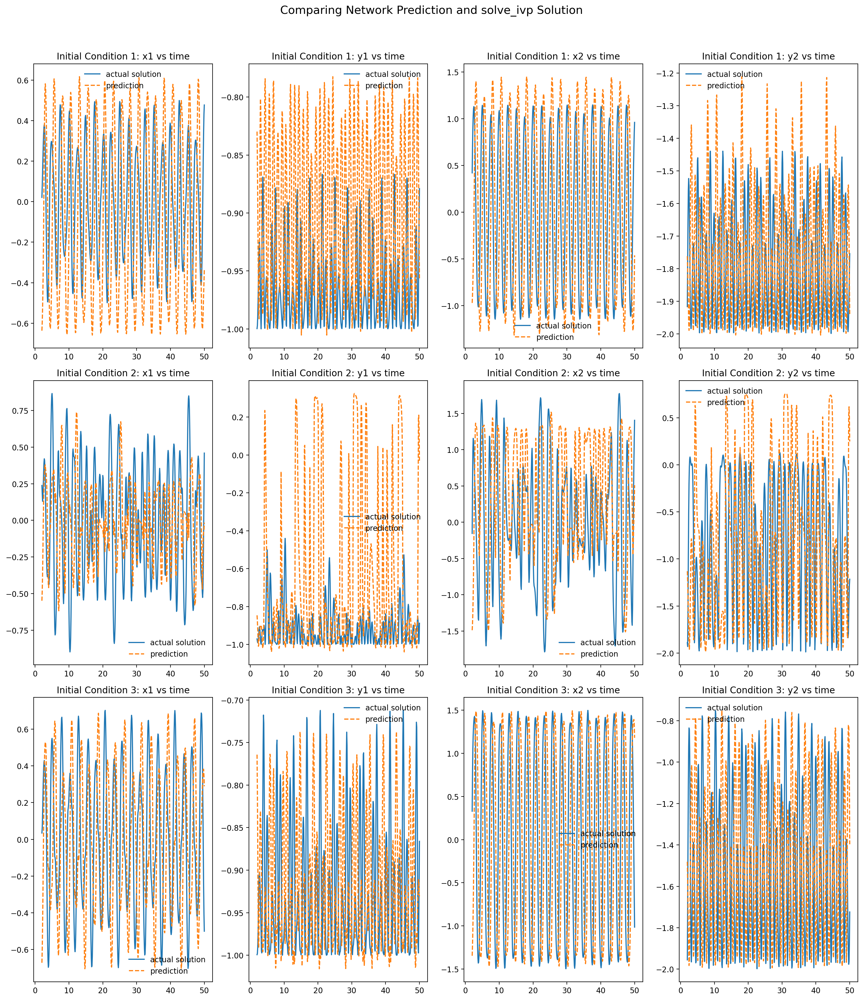

In [9]:
# Choosing the initial conditions
initial_conditions = [
    [np.pi/6, 0, np.pi/6, 0],
    [np.pi/3, 0, np.pi/3, 0],
    [np.pi/4, 0, np.pi/4, 0]
]

# Defining a figure and its subplots
fig, axes = plt.subplots(len(initial_conditions), 4, figsize=(16, 6*len(initial_conditions))) 
fig.suptitle('Comparing Network Prediction and solve_ivp Solution', y=1.02, fontsize=15)  

# Looping through each set of initial conditions
for i, z0_var in enumerate(initial_conditions):
    
    # Computing the trajectory
    ret_var = solve_ivp(rhs, (0, tmax), z0_var, t_eval=t, args=(L1, L2, m1, m2, g))
    positions_var = to_cartesian(*ret_var.y, L1, L2)
    x1_var, y1_var, x2_var, y2_var = positions_var[:4]

    # Preparing the data sequence for the prediction
    Input_var = [np.vstack((x1_var[j:j+window], y1_var[j:j+window], x2_var[j:j+window], y2_var[j:j+window])).T for j in range(len(x1_var) - window)]
    Input_var = np.array(Input_var)

    # Using the trained RNN model to predict the future positions 
    predictions = model.predict(Input_var,verbose=0)
    # Plotting x1
    axes[i, 0].plot(t[offset:], x1_var[offset:], label='actual solution')
    axes[i, 0].plot(t[offset:], predictions[:, 0], label='prediction', linestyle='dashed')
    axes[i, 0].set_title(f'Initial Condition {i+1}: x1 vs time')
    axes[i, 0].legend()

    # Plotting y1
    axes[i, 1].plot(t[offset:], y1_var[offset:], label='actual solution')
    axes[i, 1].plot(t[offset:], predictions[:, 1], label='prediction', linestyle='dashed')
    axes[i, 1].set_title(f'Initial Condition {i+1}: y1 vs time')
    axes[i, 1].legend()

    # Plotting x2
    axes[i, 2].plot(t[offset:], x2_var[offset:], label='actual solution')
    axes[i, 2].plot(t[offset:], predictions[:, 2], label='prediction', linestyle='dashed')
    axes[i, 2].set_title(f'Initial Condition {i+1}: x2 vs time')
    axes[i, 2].legend()

    # Plotting y2
    axes[i, 3].plot(t[offset:], y2_var[offset:], label='actual solution')
    axes[i, 3].plot(t[offset:], predictions[:, 3], label='prediction', linestyle='dashed')
    axes[i, 3].set_title(f'Initial Condition {i+1}: y2 vs time')
    axes[i, 3].legend()

# Adjusting subplot layout
plt.tight_layout()
plt.show()

We can see that the model predicts the future of the given initial condition fairly well, but when the initial angle is increased, we can see that the chaotic behavior of the pendulum is not well captivated as expected. 

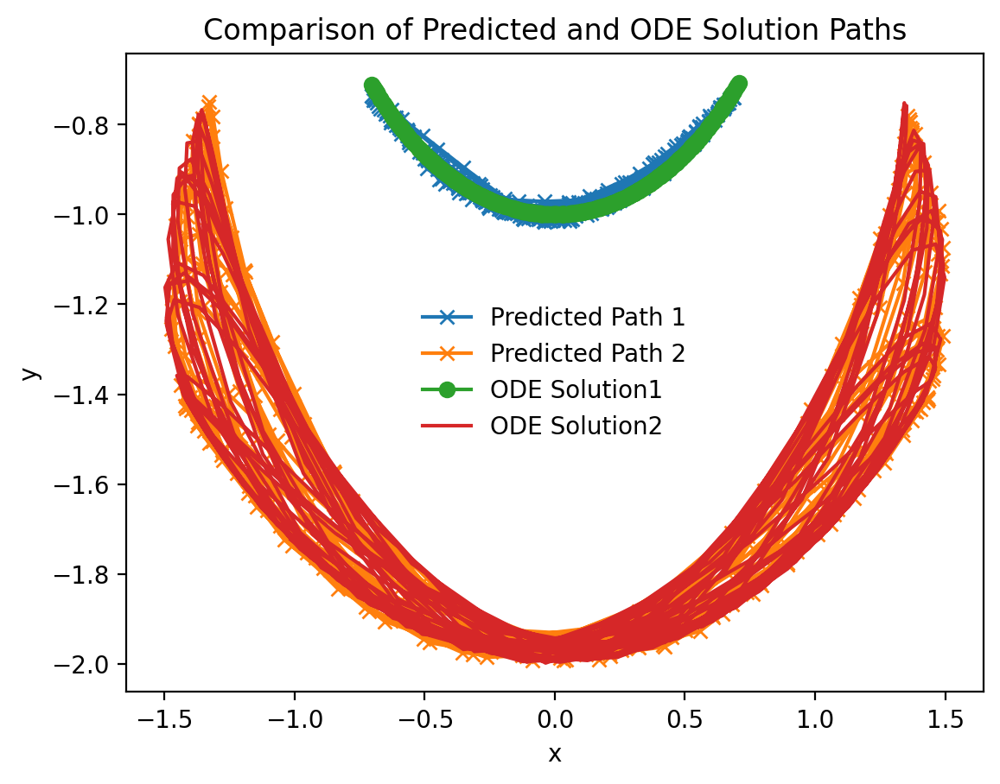

In [10]:
plt.plot(predictions[:, 0], predictions[:, 1],marker = 'x', label='Predicted Path 1')
plt.plot(predictions[:, 2], predictions[:, 3],marker = 'x', label='Predicted Path 2')
plt.plot(x1, y1,marker ='o', label='ODE Solution1')
plt.plot(x2, y2, label='ODE Solution2')
plt.xlabel('x')
plt.ylabel('y')
plt.title('Comparison of Predicted and ODE Solution Paths')
plt.legend()
plt.show()

Now we test on how far we can predict into the future. We vary the extrapolation time in the code so that we train different models with labels further down the timeline. 

3/3 [==============================] - 1s 8ms/step


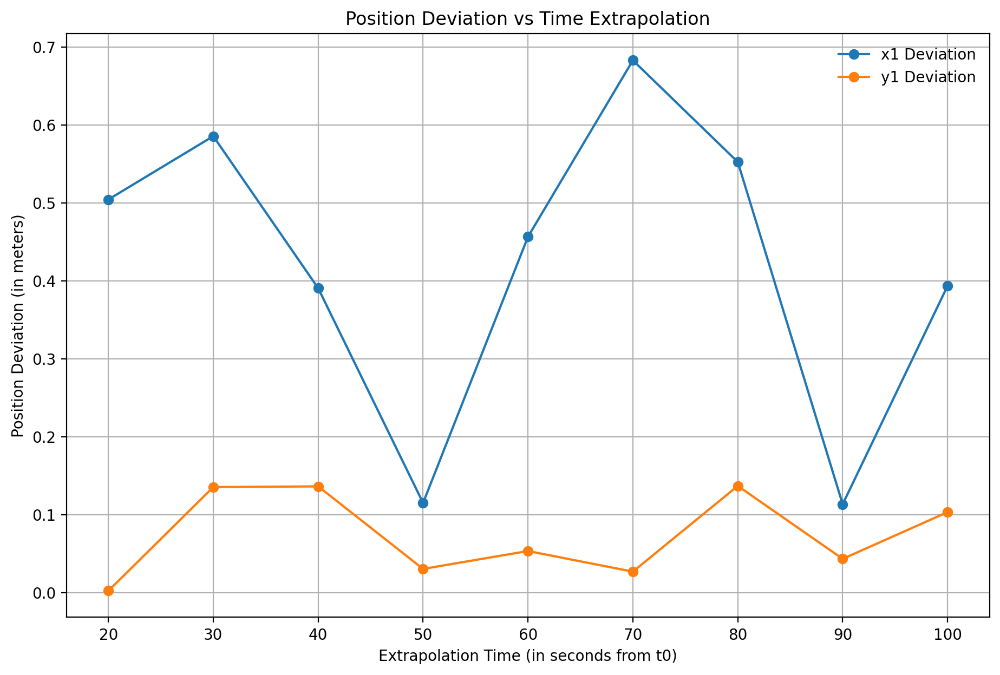

In [11]:
extrapolation_times = np.arange(20, 101, 10)
# Lists to store deviations between predicted and actual positions for x1 and y1 over different extrapolation times
x1_deviations = []
y1_deviations = []

# Iterating over the specified extrapolation times to assess prediction accuracy for each time point
for offset in extrapolation_times:
    z0_train = [np.pi/4, 0, np.pi/4, 0]
    ret_train = solve_ivp(rhs, (0, tmax), z0_train, t_eval=t, args=(L1, L2, m1, m2, g))
    positions_train = to_cartesian(*ret_train.y, L1, L2)
    x1_train, y1_train, x2_train, y2_train = positions_train[:4]
    Input, Label = [],[]
    for i in range(len(x1) - window- offset):
    # Stack the next positions of both masses to serve as the input sequence
        Input.append(np.vstack((x1[i:i+window], y1[i:i+window], x2[i:i+window], y2[i:i+window])).T)
        Label.append([x1[i+window+offset], y1[i+window+offset], x2[i+window+offset], y2[i+window+offset]])
    
    Input = np.array(Input)
    Label = np.array(Label)
    
    model = keras.models.Sequential()
    model.add(keras.layers.LSTM(64,input_shape=(None,4), return_sequences=True))
    model.add(keras.layers.LSTM(64, return_sequences=True))
    model.add(keras.layers.LSTM(32, return_sequences=True))
    model.add(keras.layers.LSTM(32, return_sequences=False))
    model.add(keras.layers.Dense(4, activation="linear")) 
    model.compile(loss='mean_squared_error', optimizer='adam')
    
    model.fit(Input[:299,:,:], Label[:299,:], epochs=50, batch_size= 60, validation_split=0.2, verbose=0)
    predicted_position_at_offset = model.predict(Input[300:,:,:])
    
    # Extracting the Cartesian positions of the first mass (x1 and y1) from the extrapolated solution
    x1_actual, y1_actual, _, _ = positions_train[:4]
    
    # Calculate deviations between the predicted position at extrapolation time and the actual position
    x1_dev = abs(predicted_position_at_offset[0][0] - x1_actual[offset+300])
    y1_dev = abs(predicted_position_at_offset[0][1] - y1_actual[offset+300])
    x1_deviations.append(x1_dev)
    y1_deviations.append(y1_dev)
    

# Creating a figure to display the plot
plt.figure(figsize=(11, 7))
plt.plot(extrapolation_times, x1_deviations, label='x1 Deviation', marker='o')
plt.plot(extrapolation_times, y1_deviations, label='y1 Deviation', marker='o')
plt.xlabel('Extrapolation Time (in seconds from t0)')
plt.ylabel('Position Deviation (in meters)')
plt.title('Position Deviation vs Time Extrapolation')
plt.legend()
plt.grid(True)

plt.show()

In the initial condition of $pi/4$ the movement of the pendulum is fairly easy to predict into the future as the chaotic nature is not strongly present. we can see that even at 100 seconds into the future, the model quite accurately predicts the future.

Now we train a model on a more chaotic nature, to see how the model performs

In [12]:
model = keras.models.Sequential()
model.add(keras.layers.LSTM(64,input_shape=(None,4), return_sequences=True))
model.add(keras.layers.LSTM(64, return_sequences=True))
model.add(keras.layers.LSTM(32, return_sequences=True))
model.add(keras.layers.LSTM(32, return_sequences=False))
model.add(keras.layers.Dense(4, activation="linear")) 

model.compile(loss='mean_squared_error', optimizer='adam')
model.summary()

Model: "sequential_10"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_40 (LSTM)              (None, None, 64)          17664     
                                                                 
 lstm_41 (LSTM)              (None, None, 64)          33024     
                                                                 
 lstm_42 (LSTM)              (None, None, 32)          12416     
                                                                 
 lstm_43 (LSTM)              (None, 32)                8320      
                                                                 
 dense_10 (Dense)            (None, 4)                 132       
                                                                 
Total params: 71556 (279.52 KB)
Trainable params: 71556 (279.52 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


In [13]:
z0_chaotic = [np.pi/2, 0, np.pi/2, 0]
ret_chaotic = solve_ivp(rhs, (0, tmax), z0_chaotic, t_eval=t, args=(L1, L2, m1, m2, g))
positions_chaotic = to_cartesian(*ret_chaotic.y, L1, L2)
x1_chaotic, y1_chaotic, x2_chaotic, y2_chaotic = positions_chaotic[:4]
Input_chaotic, Label_chaotic = [], []

# Looping through positions
for i in range(len(x1_chaotic) - window- offset):
    Input_chaotic.append(np.vstack((x1_chaotic[i:i+window], y1_chaotic[i:i+window], x2_chaotic[i:i+window], y2_chaotic[i:i+window])).T)
    Label_chaotic.append([x1_chaotic[i+window+offset], y1_chaotic[i+window+offset], x2_chaotic[i+window+offset], y2_chaotic[i+window+offset]])

Input_chaotic = np.array(Input_chaotic)
Label_chaotic = np.array(Label_chaotic)

# Training the model using input sequences to predict future positions, validating on 20% of the data
Xtrain_chaotic = Input_chaotic[0:399,:,:]
Ytrain_chaotic = Label_chaotic[0:399,:]
Xtest_chaotic = Input_chaotic[400:,:,:]
Ytest_chaotic = Label_chaotic[400:,:]
model.fit(Xtrain_chaotic, Ytrain_chaotic, epochs=70, batch_size=10, validation_split=0.2)

Epoch 1/70
31/31 [==============================] - 8s 70ms/step - loss: 0.5403 - val_loss: 0.6914
Epoch 2/70
31/31 [==============================] - 1s 21ms/step - loss: 0.4817 - val_loss: 0.7523
Epoch 3/70
31/31 [==============================] - 1s 21ms/step - loss: 0.4552 - val_loss: 0.8432
Epoch 4/70
31/31 [==============================] - 1s 23ms/step - loss: 0.4547 - val_loss: 0.8509
Epoch 5/70
31/31 [==============================] - 1s 23ms/step - loss: 0.4341 - val_loss: 0.8226
Epoch 6/70
31/31 [==============================] - 1s 23ms/step - loss: 0.4290 - val_loss: 0.7779
Epoch 7/70
31/31 [==============================] - 1s 20ms/step - loss: 0.4200 - val_loss: 0.8766
Epoch 8/70
31/31 [==============================] - 1s 20ms/step - loss: 0.3948 - val_loss: 0.9290
Epoch 9/70
31/31 [==============================] - 1s 21ms/step - loss: 0.3950 - val_loss: 0.9321
Epoch 10/70
31/31 [==============================] - 1s 22ms/step - loss: 0.3883 - val_loss: 0.8380
Epoch 11/

16/16 [==============================] - 0s 9ms/step


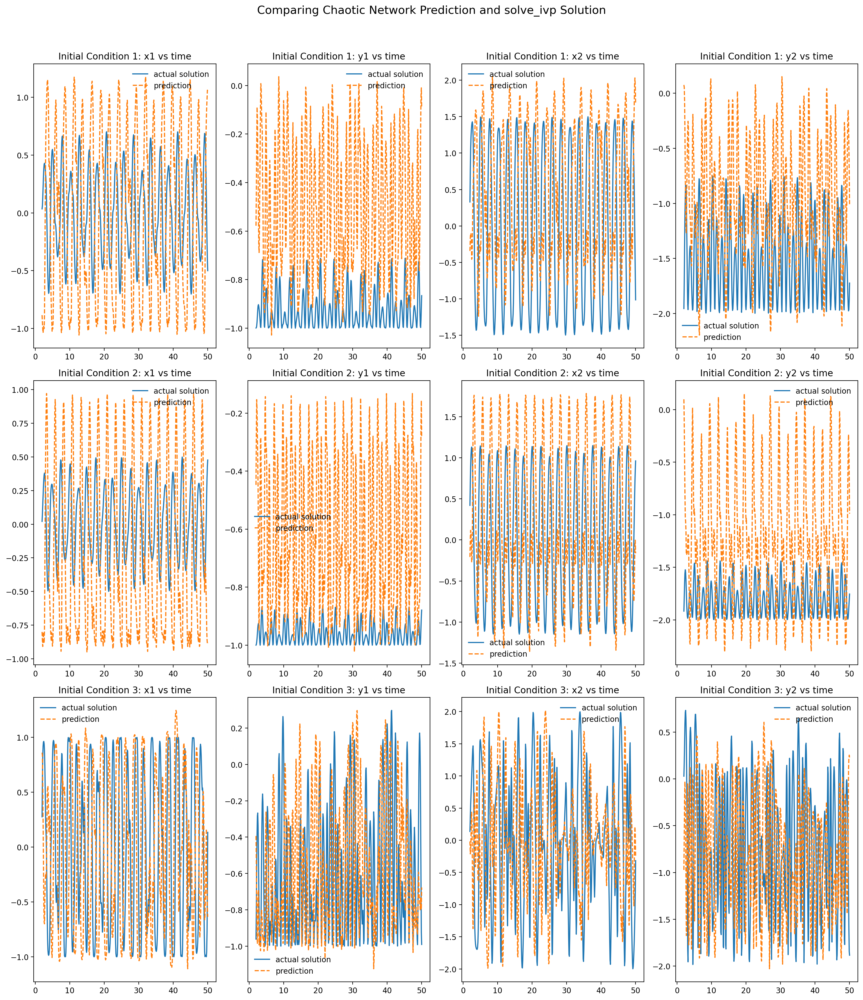

In [14]:
# Choosing the initial conditions
offset = 20
initial_conditions_chaotic = [
    [np.pi/4, 0, np.pi/4, 0],
    [np.pi/6, 0, np.pi/6, 0],
    [np.pi/2, 0, np.pi/2, 0]
]

# Defining a figure and its subplots
fig, axes = plt.subplots(len(initial_conditions_chaotic), 4, figsize=(16, 6*len(initial_conditions_chaotic))) 
fig.suptitle('Comparing Chaotic Network Prediction and solve_ivp Solution', y=1.02, fontsize=15)  


# Looping through each set of initial conditions
for i, z0_chaotic in enumerate(initial_conditions_chaotic):
    
    # Computing the trajectory
    ret_chaotic = solve_ivp(rhs, (0, tmax), z0_chaotic, t_eval=t, args=(L1, L2, m1, m2, g))
    positions_chaotic = to_cartesian(*ret_chaotic.y, L1, L2)
    x1_chaotic, y1_chaotic, x2_chaotic, y2_chaotic = positions_chaotic[:4]

    # Preparing the data sequence for the prediction
    Input_chaotic = [np.vstack((x1_chaotic[j:j+window], y1_chaotic[j:j+window], x2_chaotic[j:j+window], y2_chaotic[j:j+window])).T for j in range(len(x1_chaotic) - window)]
    Input_chaotic = np.array(Input_chaotic)

    # Using the trained RNN model to predict the future positions 
    predictions = model.predict(Input_chaotic)
    
    # Plotting x1
    axes[i, 0].plot(t[offset:], x1_chaotic[offset:], label='actual solution')
    axes[i, 0].plot(t[offset:], predictions[:,0], label='prediction', linestyle='dashed')
    axes[i, 0].set_title(f'Initial Condition {i+1}: x1 vs time')
    axes[i, 0].legend()

    # Plotting y1
    axes[i, 1].plot(t[offset:], y1_chaotic[offset:], label='actual solution')
    axes[i, 1].plot(t[offset:], predictions[:, 1], label='prediction', linestyle='dashed')
    axes[i, 1].set_title(f'Initial Condition {i+1}: y1 vs time')
    axes[i, 1].legend()

    # Plotting x2
    axes[i, 2].plot(t[offset:], x2_chaotic[offset:], label='actual solution')
    axes[i, 2].plot(t[offset:], predictions[:, 2], label='prediction', linestyle='dashed')
    axes[i, 2].set_title(f'Initial Condition {i+1}: x2 vs time')
    axes[i, 2].legend()

    # Plotting y2
    axes[i, 3].plot(t[offset:], y2_chaotic[offset:], label='actual solution')
    axes[i, 3].plot(t[offset:], predictions[:, 3], label='prediction', linestyle='dashed')
    axes[i, 3].set_title(f'Initial Condition {i+1}: y2 vs time')
    axes[i, 3].legend()
# Adjusting subplot layout
plt.tight_layout()
plt.show()


As expected, the model trained on the more chaotic behavior of the pendulum fails to predict the future of different initial conditions. We can see that it somewhat predicts the future of the system it was trained on,

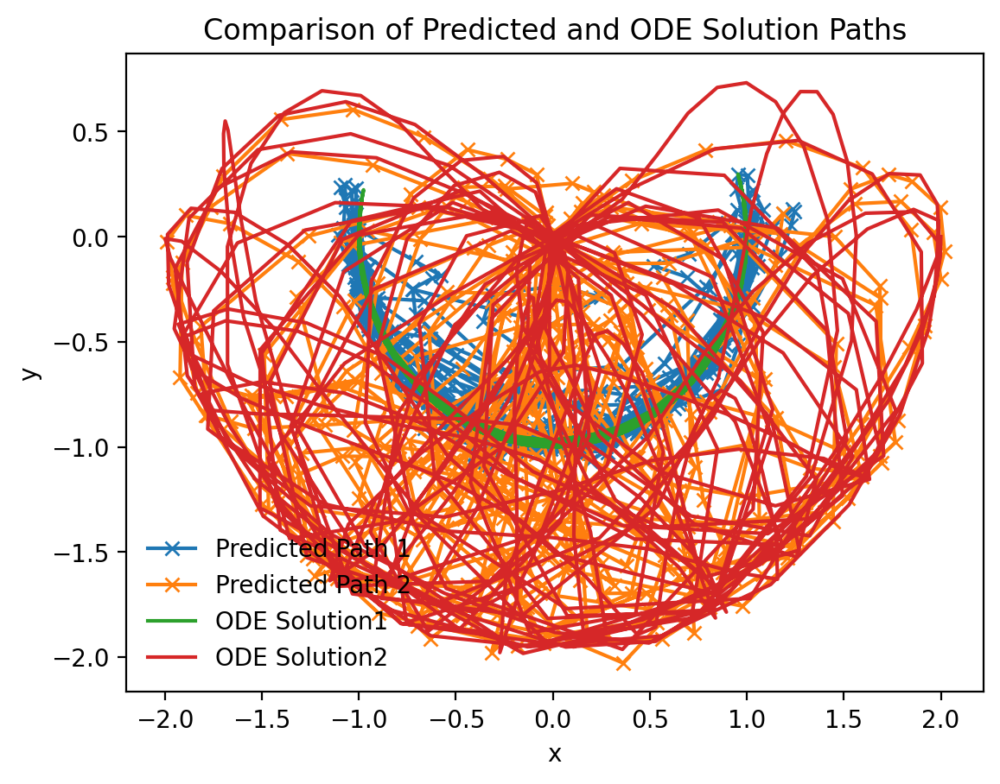

In [15]:
plt.plot(predictions[:, 0], predictions[:, 1],marker = 'x', label='Predicted Path 1')
plt.plot(predictions[:, 2], predictions[:, 3],marker = 'x', label='Predicted Path 2')
plt.plot(x1_chaotic, y1_chaotic, label='ODE Solution1')
plt.plot(x2_chaotic, y2_chaotic, label='ODE Solution2')
plt.xlabel('x')
plt.ylabel('y')
plt.title('Comparison of Predicted and ODE Solution Paths')
plt.legend()
plt.show()

Now we test the chaotic model on a time extrapolation

In [16]:
z0_complex = [np.pi/2, 0, np.pi/2, 0]
ret_complex = solve_ivp(rhs, (0, tmax), z0_complex, t_eval=t, args=(L1, L2, m1, m2, g))
positions_complex = to_cartesian(*ret_complex.y, L1, L2)
x1_complex, y1_complex, x2_complex, y2_complex = positions_complex[:4]

deviations_chaotic = []

# Looping over extrapolation times, from 20 steps ahead to 100 steps ahead
for delta in np.arange(20, 101, 10):
    X_complex, Y_complex = [], []
    
    for i in range(len(x1_complex) - delta):
        X_complex.append(np.vstack((x1_complex[i:i+delta], y1_complex[i:i+delta], x2_complex[i:i+delta], y2_complex[i:i+delta])).T)
        Y_complex.append([x1_complex[i+delta], y1_complex[i+delta], x2_complex[i+delta], y2_complex[i+delta]])

    # Converting lists to numpy arrays for model training
    X_complex = np.array(X_complex)
    Y_complex = np.array(Y_complex)

    model_complex = keras.models.Sequential()
    model_complex.add(keras.layers.LSTM(64,input_shape=(None,4), return_sequences=True))
    model_complex.add(keras.layers.LSTM(64, return_sequences=True))
    model_complex.add(keras.layers.LSTM(32, return_sequences=True))
    model_complex.add(keras.layers.LSTM(32, return_sequences=False))
    model_complex.add(keras.layers.Dense(4, activation="linear")) 
    model_complex.compile(optimizer='adam', loss='mse')
    model_complex.fit(X_complex, Y_complex, epochs=50, batch_size=32, validation_split=0.2, verbose=0)
    predictions = model_complex.predict(X_complex)
    deviation_chaotic = np.mean(np.sqrt(np.sum(np.square(predictions - Y_complex), axis=1)))
    deviations_chaotic.append(deviation_chaotic)


plt.plot(np.arange(20, 101, 10), deviations_chaotic)
plt.xlabel("Extrapolation Time (in seconds)")
plt.ylabel("Mean Deviation (in meters)")
plt.title("Position deviation vs. Extrapolation time for complex path")

plt.show()

15/15 [==============================] - 1s 14ms/step


As expected, the deviation is larger than the less chaotic model

Now we continue the training on just the position of the second mass, which we expect the accuracy of the prediction to drop further down.

In [ ]:
z0 = [np.pi/4, 0, np.pi/4, 0]
ret = solve_ivp(rhs, (0, tmax), z0, t_eval=t, args=(L1, L2, m1, m2, g))
positions = to_cartesian(*ret.y, L1, L2)
x2_final, y2_final = positions[2], positions[3]

In [ ]:
X, Y = [], []

# Generating input sequences and targets for training
for i in range(len(x2) - window- offset):
    # Stacking positions of mass m2 to serve as input sequence
    X.append(np.vstack((x2[i:i+window], y2[i:i+window])).T)
    Y.append([x2[i+window+offset], y2[i+window+offset]])

# Converting lists to numpy arrays for training
X = np.array(X)
Y = np.array(Y)

In [ ]:
# Defining the RNN model focused on m2
model_m2 = keras.models.Sequential()
model_m2.add(keras.layers.LSTM(64,input_shape=(None,2), return_sequences=True))
model_m2.add(keras.layers.LSTM(64, return_sequences=True))
model_m2.add(keras.layers.LSTM(32, return_sequences=True))
model_m2.add(keras.layers.LSTM(32, return_sequences=False))
model_m2.add(keras.layers.Dense(2, activation="linear")) 

# Compiling the model
model_m2.compile(optimizer='adam', loss='mse')

# Training the model
model_m2.fit(X, Y, epochs=50, batch_size=32, validation_split=0.2)

Epoch 1/50
12/12 [==============================] - 11s 201ms/step - loss: 1.0383 - val_loss: 0.6553
Epoch 2/50
12/12 [==============================] - 0s 34ms/step - loss: 0.5656 - val_loss: 0.3262
Epoch 3/50
12/12 [==============================] - 1s 44ms/step - loss: 0.1746 - val_loss: 0.0750
Epoch 4/50
12/12 [==============================] - 1s 53ms/step - loss: 0.0608 - val_loss: 0.0265
Epoch 5/50
12/12 [==============================] - 1s 46ms/step - loss: 0.0252 - val_loss: 0.0180
Epoch 6/50
12/12 [==============================] - 1s 54ms/step - loss: 0.0168 - val_loss: 0.0139
Epoch 7/50
12/12 [==============================] - 1s 51ms/step - loss: 0.0152 - val_loss: 0.0112
Epoch 8/50
12/12 [==============================] - 1s 47ms/step - loss: 0.0143 - val_loss: 0.0124
Epoch 9/50
12/12 [==============================] - 1s 46ms/step - loss: 0.0121 - val_loss: 0.0109
Epoch 10/50
12/12 [==============================] - 1s 54ms/step - loss: 0.0115 - val_loss: 0.0096
Epoch 1

16/16 [==============================] - 0s 11ms/step


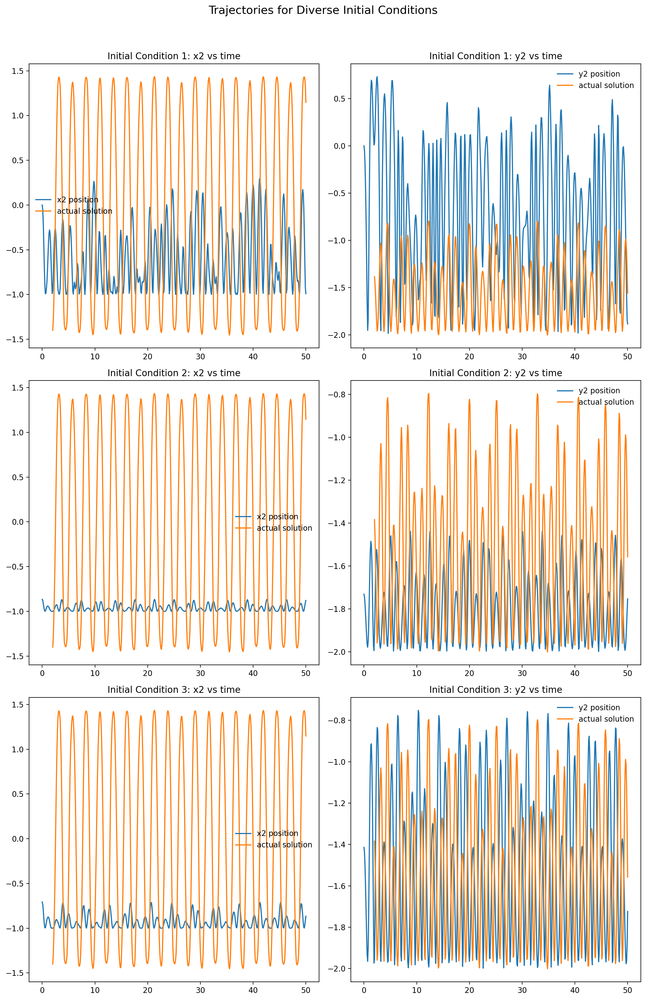

In [ ]:
#### –––– Testing the stability of the network to variations in initial conditions –––––– 

# Defining different initial conditions

initial_conditions = [
      [np.pi/2, 0, np.pi/2,0],
    [np.pi/6, 0, np.pi/6, 0],
    [np.pi/4, 0, np.pi/4, 0]
]

# Defining a figure and its subplots
fig, axes = plt.subplots(len(initial_conditions), 2, figsize=(12, 6*len(initial_conditions))) 

# Setting the main title for the figure
fig.suptitle('Trajectories for Diverse Initial Conditions', y=1.02, fontsize=15)  

# Looping through each set of initial conditions
for i, z0_complex in enumerate(initial_conditions):

    ret_complex = solve_ivp(rhs, (0, tmax), z0_complex, t_eval=t, args=(L1, L2, m1, m2, g))
    positions_complex = to_cartesian(*ret_complex.y, L1, L2)
    X_final = [np.vstack((x2_final[j:j+window], y2_final[j:j+window])).T for j in range(len(x2_final) - window)]
    X_final = np.array(X_final)
    predictions = model_m2.predict(X_final)
    # Extracting the cartesian coordinates of only the second pendulum mass for the simulated trajectory / motion
    x2_complex, y2_complex = positions_complex[1],positions_complex[3]

    # Plotting the x2 coordinate
    axes[i, 0].plot(t, x2_complex, label='x2 position')
    axes[i, 0].plot(t[offset:], predictions[:,0], label='actual solution')
    axes[i, 0].set_title(f'Initial Condition {i+1}: x2 vs time')
    axes[i, 0].legend()
    
    # Plotting the y2 coordinate
    axes[i, 1].plot(t, y2_complex, label='y2 position')
    axes[i, 1].plot(t[offset:], predictions[:,1], label='actual solution')
    axes[i, 1].set_title(f'Initial Condition {i+1}: y2 vs time')
    axes[i, 1].legend()

# Adjusting subplot layout for optimal display
plt.tight_layout()

plt.show()

As expected, the model fails to accurately predict any of the initial conditions well.

3/3 [==============================] - 2s 13ms/step


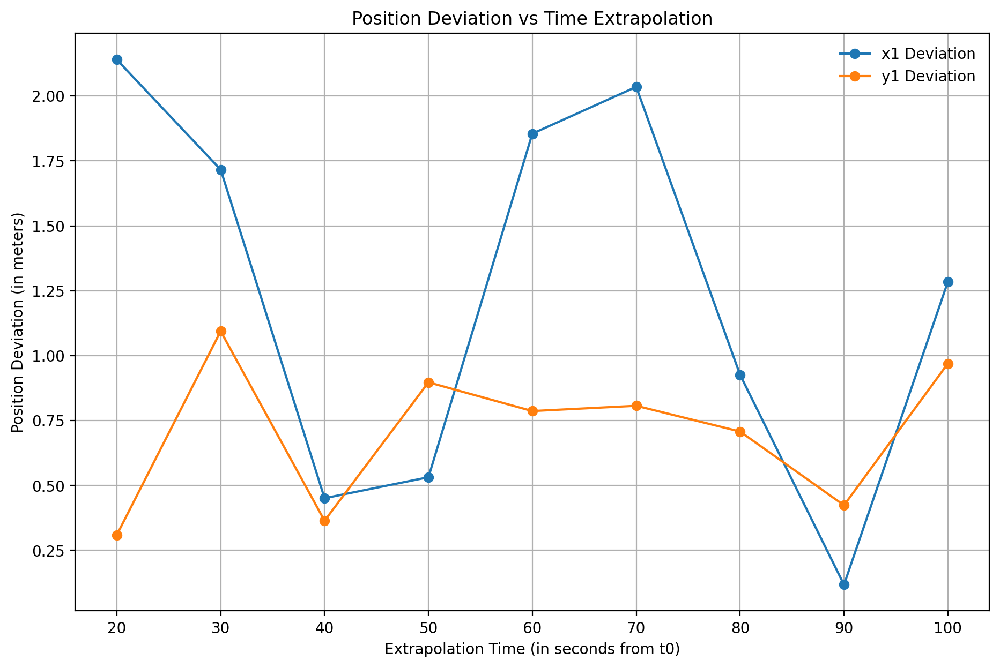

In [ ]:
# Lists to store deviations between predicted and actual positions for x1 and y1 over different extrapolation times
x2_final_deviations = []
y2_final_deviations = []

# Iterating over the specified extrapolation times to assess prediction accuracy for each time point
for offset in extrapolation_times:
    z0_train = [np.pi/4, 0, np.pi/4, 0]
    ret_train = solve_ivp(rhs, (0, tmax), z0_train, t_eval=t, args=(L1, L2, m1, m2, g))
    
    positions_train = to_cartesian(*ret_train.y, L1, L2)
    x2_train_final, y2_train_final = positions_train[2],positions_train[3]
    X, Y = [],[]
    for i in range(len(x2_train_final) - window- offset):
        X.append(np.vstack((x2_train_final[i:i+window], y2_train_final[i:i+window])).T)
    # Record the positions of both masses 20 steps ahead from the current timestep to set as the prediction target
        Y.append([x2_train_final[i+window+offset], y2_train_final[i+window+offset]])
    
    X = np.array(X)
    Y = np.array(Y)
    
    model = keras.models.Sequential()
    model.add(keras.layers.LSTM(64,input_shape=(None,2), return_sequences=True))
    model.add(keras.layers.LSTM(64, return_sequences=True))
    model.add(keras.layers.LSTM(32, return_sequences=True))
    model.add(keras.layers.LSTM(32, return_sequences=False))
    model.add(keras.layers.Dense(2, activation="linear")) 
    model.compile(optimizer='adam', loss='mse')
    model.fit(X[:299,:,:], Y[:299,:], epochs=50, batch_size= 60, validation_split=0.2, verbose=0)
    predicted_position_at_offset = model.predict(X[300:,:,:])
    
    # Extracting the Cartesian positions of the first mass (x1 and y1) from the extrapolated solution
    
    # Calculate deviations between the predicted position at extrapolation time and the actual position
    x2_dev = abs(predicted_position_at_offset[0][0] - x2_train_final[offset+300])
    y2_dev = abs(predicted_position_at_offset[0][1] - y2_train_final[offset+300])
    x2_final_deviations.append(x2_dev)
    y2_final_deviations.append(y2_dev)
    

# Creating a figure to display the plot
plt.figure(figsize=(11, 7))
plt.plot(extrapolation_times, x2_final_deviations, label='x1 Deviation', marker='o')
plt.plot(extrapolation_times, y2_final_deviations, label='y1 Deviation', marker='o')
plt.xlabel('Extrapolation Time (in seconds from t0)')
plt.ylabel('Position Deviation (in meters)')
plt.title('Position Deviation vs Time Extrapolation')
plt.legend()
plt.grid(True)

plt.show()

Now we train the more chaotic model on with just the m2 value to see the results

In [14]:
z0 = [np.pi/2, 0, np.pi/2, 0]
ret = solve_ivp(rhs, (0, tmax), z0, t_eval=t, args=(L1, L2, m1, m2, g))
positions = to_cartesian(*ret.y, L1, L2)
x2_final, y2_final = positions[2], positions[3]

X, Y = [], []

# Generating input sequences and targets for training
for i in range(len(x2) - window- offset):
    # Stacking positions of mass m2 to serve as input sequence
    X.append(np.vstack((x2[i:i+window], y2[i:i+window])).T)
    Y.append([x2[i+window+offset], y2[i+window+offset]])

# Converting lists to numpy arrays for training
X = np.array(X)
Y = np.array(Y)

# Defining the RNN model focused on m2
model_m2 = keras.models.Sequential()
model_m2.add(keras.layers.LSTM(64,input_shape=(None,2), return_sequences=True))
model_m2.add(keras.layers.LSTM(64, return_sequences=True))
model_m2.add(keras.layers.LSTM(32, return_sequences=True))
model_m2.add(keras.layers.LSTM(32, return_sequences=False))
model_m2.add(keras.layers.Dense(2, activation="linear")) 

# Compiling the model
model_m2.compile(optimizer='adam', loss='mse')

# Training the model
model_m2.fit(X, Y, epochs=50, batch_size=32, validation_split=0.2)

Epoch 1/50
10/10 [==============================] - 8s 178ms/step - loss: 1.0977 - val_loss: 0.6748
Epoch 2/50
10/10 [==============================] - 0s 27ms/step - loss: 0.5249 - val_loss: 0.2861
Epoch 3/50
10/10 [==============================] - 0s 28ms/step - loss: 0.1587 - val_loss: 0.0641
Epoch 4/50
10/10 [==============================] - 0s 27ms/step - loss: 0.0693 - val_loss: 0.0534
Epoch 5/50
10/10 [==============================] - 0s 28ms/step - loss: 0.0329 - val_loss: 0.0283
Epoch 6/50
10/10 [==============================] - 0s 28ms/step - loss: 0.0244 - val_loss: 0.0194
Epoch 7/50
10/10 [==============================] - 0s 29ms/step - loss: 0.0198 - val_loss: 0.0192
Epoch 8/50
10/10 [==============================] - 0s 28ms/step - loss: 0.0176 - val_loss: 0.0145
Epoch 9/50
10/10 [==============================] - 0s 28ms/step - loss: 0.0159 - val_loss: 0.0149
Epoch 10/50
10/10 [==============================] - 0s 27ms/step - loss: 0.0159 - val_loss: 0.0136
Epoch 11

As expected, the model accuracy is worse than the chaotic model trained with m1 and m2 values. 

16/16 [==============================] - 0s 9ms/step


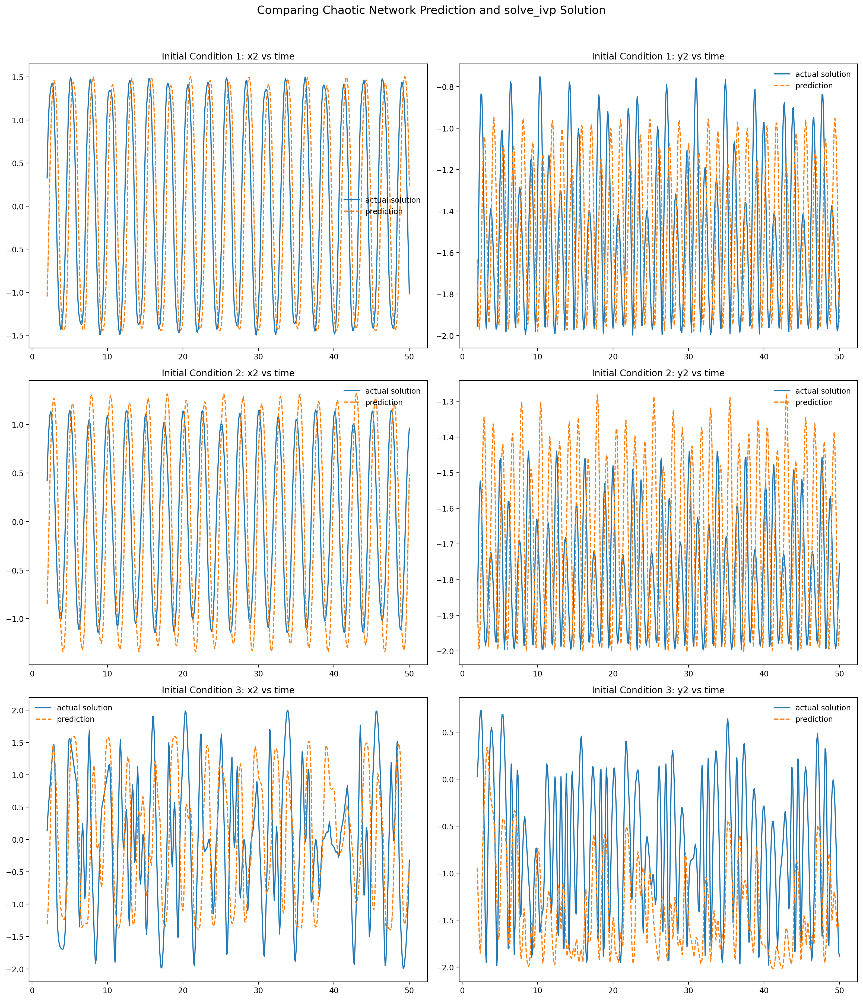

In [17]:
initial_conditions_chaotic = [
    [np.pi/4, 0, np.pi/4, 0],
    [np.pi/6, 0, np.pi/6, 0],
    [np.pi/2, 0, np.pi/2, 0]
]
offset = 20
# Defining a figure and its subplots
fig, axes = plt.subplots(len(initial_conditions_chaotic), 2, figsize=(16, 6*len(initial_conditions_chaotic))) 
fig.suptitle('Comparing Chaotic Network Prediction and solve_ivp Solution', y=1.02, fontsize=15)  


# Looping through each set of initial conditions
for i, z0_chaotic in enumerate(initial_conditions_chaotic):
    
    # Computing the trajectory
    ret_chaotic = solve_ivp(rhs, (0, tmax), z0_chaotic, t_eval=t, args=(L1, L2, m1, m2, g))
    positions_chaotic = to_cartesian(*ret_chaotic.y, L1, L2)
    x1_chaotic, y1_chaotic, x2_chaotic, y2_chaotic = positions_chaotic[:4]

    # Preparing the data sequence for the prediction
    Input_chaotic = [np.vstack(( x2_chaotic[j:j+window], y2_chaotic[j:j+window])).T for j in range(len(x1_chaotic) - window)]
    Input_chaotic = np.array(Input_chaotic)

    # Using the trained RNN model to predict the future positions 
    predictions = model_m2.predict(Input_chaotic)
    


    # Plotting x2
    axes[i, 0].plot(t[offset:], x2_chaotic[offset:], label='actual solution')
    axes[i, 0].plot(t[offset:], predictions[:, 0], label='prediction', linestyle='dashed')
    axes[i, 0].set_title(f'Initial Condition {i+1}: x2 vs time')
    axes[i, 0].legend()

    # Plotting y2
    axes[i, 1].plot(t[offset:], y2_chaotic[offset:], label='actual solution')
    axes[i, 1].plot(t[offset:], predictions[:, 1], label='prediction', linestyle='dashed')
    axes[i, 1].set_title(f'Initial Condition {i+1}: y2 vs time')
    axes[i, 1].legend()
# Adjusting subplot layout
plt.tight_layout()
plt.show()


3/3 [==============================] - 1s 12ms/step


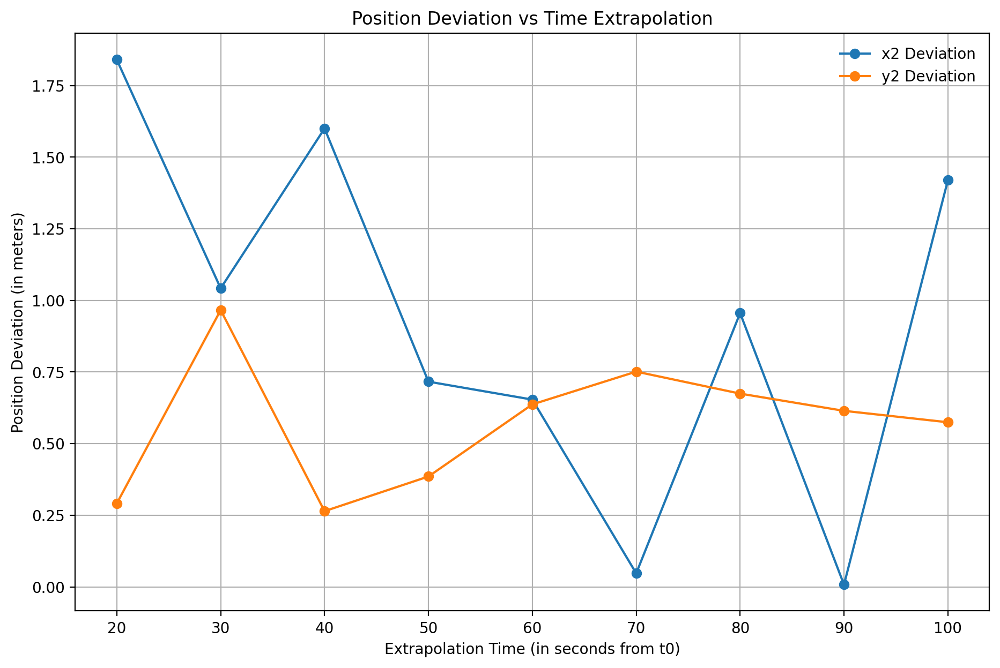

In [12]:
# Lists to store deviations between predicted and actual positions for x1 and y1 over different extrapolation times
x2_final_deviations = []
y2_final_deviations = []
extrapolation_times = np.arange(20, 101, 10)
# Iterating over the specified extrapolation times to assess prediction accuracy for each time point
for offset in extrapolation_times:
    z0_train = [np.pi/2, 0, np.pi/2, 0]
    ret_train = solve_ivp(rhs, (0, tmax), z0_train, t_eval=t, args=(L1, L2, m1, m2, g))
    
    positions_train = to_cartesian(*ret_train.y, L1, L2)
    x2_train_final, y2_train_final = positions_train[2],positions_train[3]
    X, Y = [],[]
    for i in range(len(x2_train_final) - window- offset):
        X.append(np.vstack((x2_train_final[i:i+window], y2_train_final[i:i+window])).T)
    # Record the positions of both masses 20 steps ahead from the current timestep to set as the prediction target
        Y.append([x2_train_final[i+window+offset], y2_train_final[i+window+offset]])
    
    X = np.array(X)
    Y = np.array(Y)
    
    model = keras.models.Sequential()
    model.add(keras.layers.LSTM(64,input_shape=(None,2), return_sequences=True))
    model.add(keras.layers.LSTM(64, return_sequences=True))
    model.add(keras.layers.LSTM(32, return_sequences=True))
    model.add(keras.layers.LSTM(32, return_sequences=False))
    model.add(keras.layers.Dense(2, activation="linear")) 
    model.compile(optimizer='adam', loss='mse')
    model.fit(X[:299,:,:], Y[:299,:], epochs=50, batch_size= 60, validation_split=0.2, verbose=0)
    predicted_position_at_offset = model.predict(X[300:,:,:])
    
    # Extracting the Cartesian positions of the first mass (x1 and y1) from the extrapolated solution
    
    # Calculate deviations between the predicted position at extrapolation time and the actual position
    x2_dev = abs(predicted_position_at_offset[0][0] - x2_train_final[offset+300])
    y2_dev = abs(predicted_position_at_offset[0][1] - y2_train_final[offset+300])
    x2_final_deviations.append(x2_dev)
    y2_final_deviations.append(y2_dev)
    

# Creating a figure to display the plot
plt.figure(figsize=(11, 7))
plt.plot(extrapolation_times, x2_final_deviations, label='x2 Deviation', marker='o')
plt.plot(extrapolation_times, y2_final_deviations, label='y2 Deviation', marker='o')
plt.xlabel('Extrapolation Time (in seconds from t0)')
plt.ylabel('Position Deviation (in meters)')
plt.title('Position Deviation vs Time Extrapolation')
plt.legend()
plt.grid(True)

plt.show()

The deviation calculated in the chaotic model trained with only the m2 coordiates is the largest, which is expected.

# Conclusion

We found out that using a RNN model to predict the future is possible for a double pendulum system. However, if the model is trained on a chaotic initial condition, the model fails to predict accurately the future positions of the mass. Secondly we found out that for small initial conditon angles, the system is stable enough to predict the far future up to 10 seconds in the future. However, as the system complexity increases, we can see that the model fails to predict the chaotic behaviour of the pendulum in futher future. Lastly we found out that training the model on a single mass data does not give the full information to the model, which lowers it's accuracy to its couterpart.